# NSSP Projet 2

## PART 1 : Single subject classification

### Import

In [270]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from scipy.io import loadmat 
from scipy.ndimage import convolve1d
from scipy.signal import butter, sosfiltfilt, welch
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import mutual_info_classif, SelectKBest, RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.decomposition import PCA
from matplotlib.patches import Rectangle

### Load subject 2

In [271]:
data = loadmat("data/s2/S2_A1_E1.mat")
print("Dataset variables:")
for key in data.keys():
    if not key.startswith("__"):
        print(key)

Dataset variables:
subject
exercise
stimulus
emg
glove
restimulus
repetition
rerepetition


### 1 Visualize and preprocess the data

In [272]:
emg = data["emg"]
print("EMG data dimension: {}".format(emg.shape))
print("EMG data type: {}".format(type(emg)))

stimulus = data["restimulus"] 
repetition = data["rerepetition"] 

print("Stimuli {} , Repetitions {}".format(stimulus.shape,repetition.shape))

# -1 because 0 is the resting condition
n_stimuli = len(np.unique(stimulus)) - 1 
# -1 because 0 is not a repetition
n_repetitions = len(np.unique(repetition)) - 1 
n_channels = emg.shape[1]

print(f'Number of movements : {n_stimuli}') 
print(f'Number of repetitions : {n_repetitions}') 

EMG data dimension: (100686, 10)
EMG data type: <class 'numpy.ndarray'>
Stimuli (100686, 1) , Repetitions (100686, 1)
Number of movements : 12
Number of repetitions : 10


In [273]:
number_of_samples_per_trial = np.zeros((n_stimuli, n_repetitions))

for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        
        idx = np.logical_and(stimulus == stimuli_idx+1, repetition == repetition_idx+1)
        number_of_samples_per_trial[stimuli_idx, repetition_idx] = np.sum(idx.astype(int))

print("Number of sample per trials \n Mean : {} \n std : {} \n min : {} \n max: {}".format(number_of_samples_per_trial.mean(),number_of_samples_per_trial.std(),number_of_samples_per_trial.min(),number_of_samples_per_trial.max()))

Number of sample per trials 
 Mean : 348.2583333333333 
 std : 66.62450698170723 
 min : 196.0 
 max: 516.0


#### Visualize first channel

Text(0, 0.5, 'Amplitude')

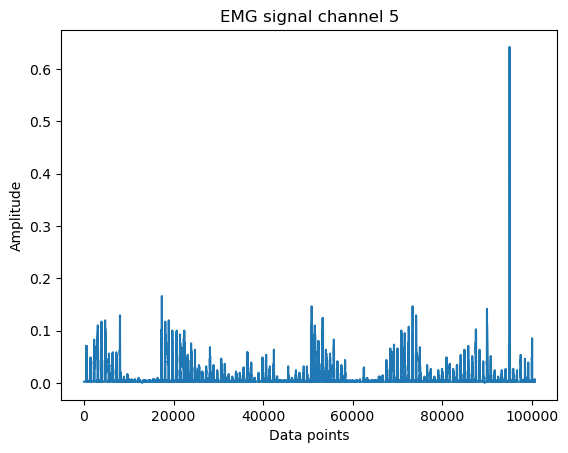

In [274]:
# Plot first channel to get a sense of the data
plt.close("all")
fig, ax = plt.subplots()
EMG_channel = 5
ax.plot(emg[:, EMG_channel])   
ax.set_title(f"EMG signal channel {EMG_channel}")
ax.set_xlabel("Data points")
ax.set_ylabel("Amplitude")

#we can already se a outlier !

#### Cut the data into trials and compute envelopes

In [275]:
# Defining the length of the moving average window
mov_mean_length = 25
mov_mean_weights = np.ones(mov_mean_length) / mov_mean_length

# Initializing the data structure
emg_windows = [[None for repetition_idx in range(n_repetitions)] for stimuli_idx in range(n_stimuli)]
emg_envelopes = [[None for repetition_idx in range(n_repetitions)] for stimuli_idx in range(n_stimuli)]

for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        idx = np.logical_and(stimulus == stimuli_idx + 1, repetition == repetition_idx + 1).flatten()
        emg_windows[stimuli_idx][repetition_idx] = emg[idx, :]
        emg_envelopes[stimuli_idx][repetition_idx] = convolve1d(emg_windows[stimuli_idx][repetition_idx], 
                                                                mov_mean_weights, axis=0)

#### Visualize all channels for one trials of each stimuli

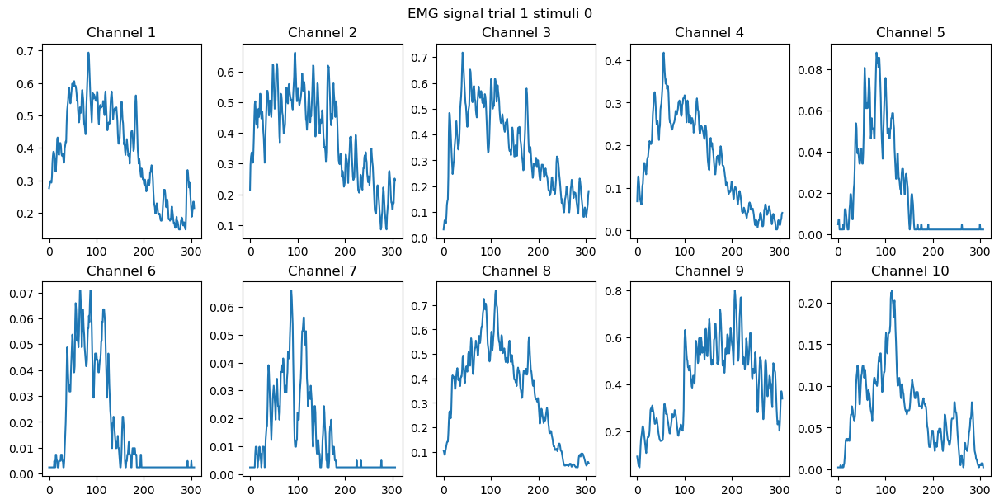

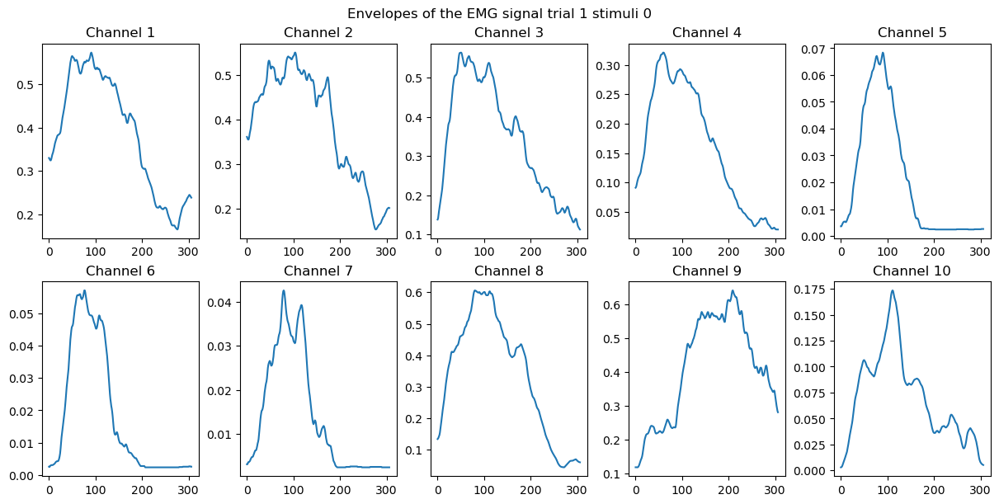

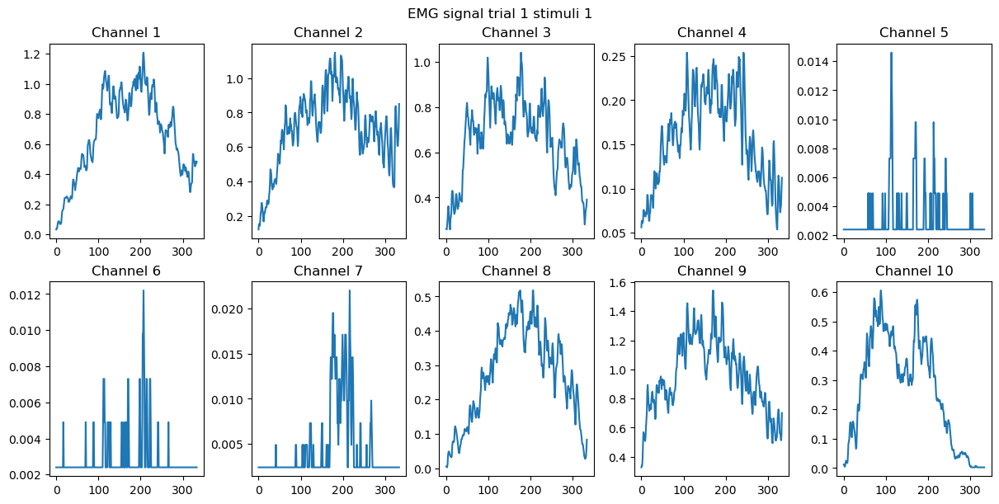

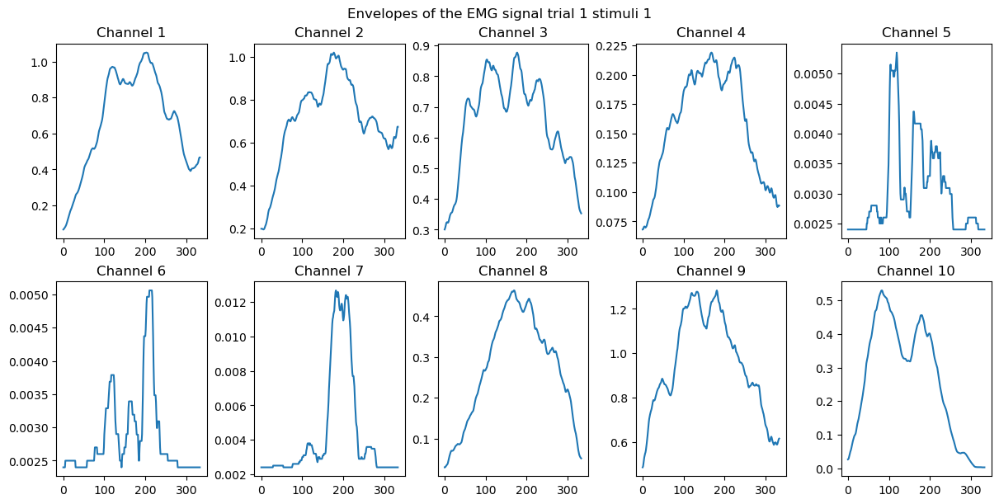

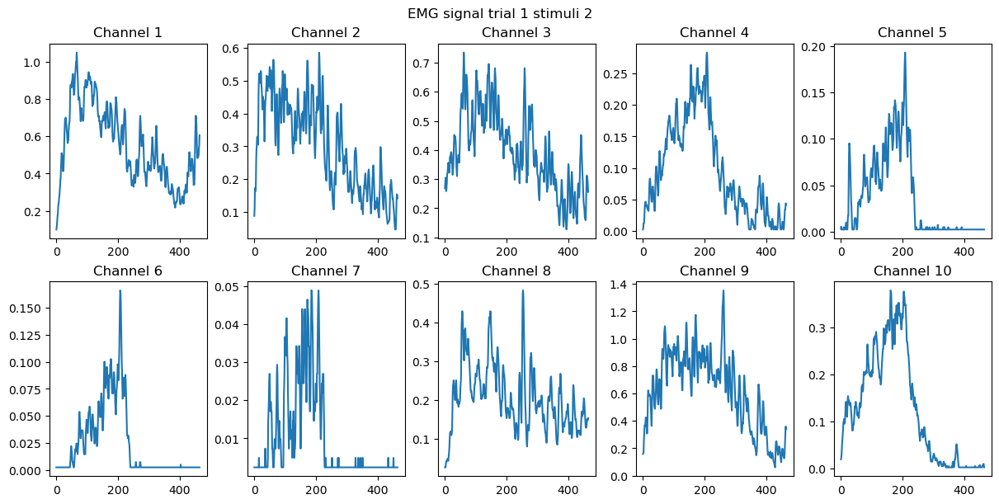

...

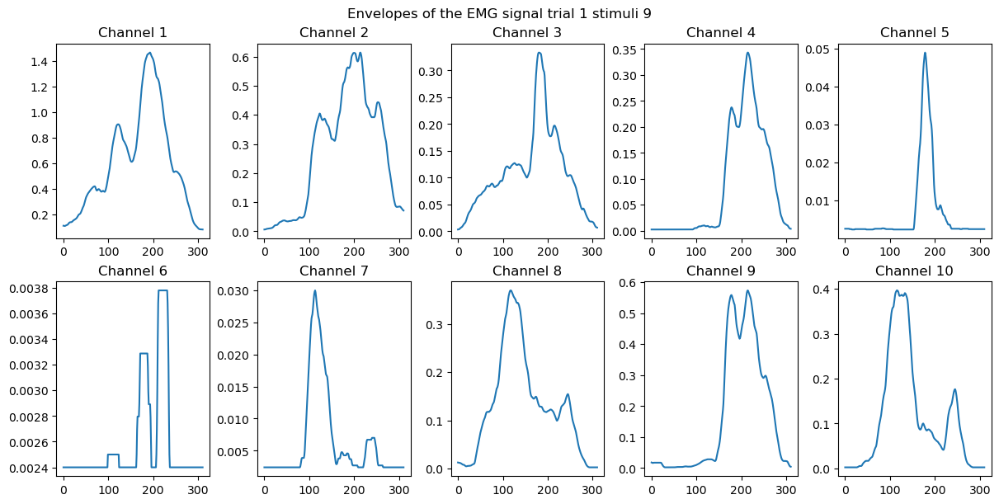

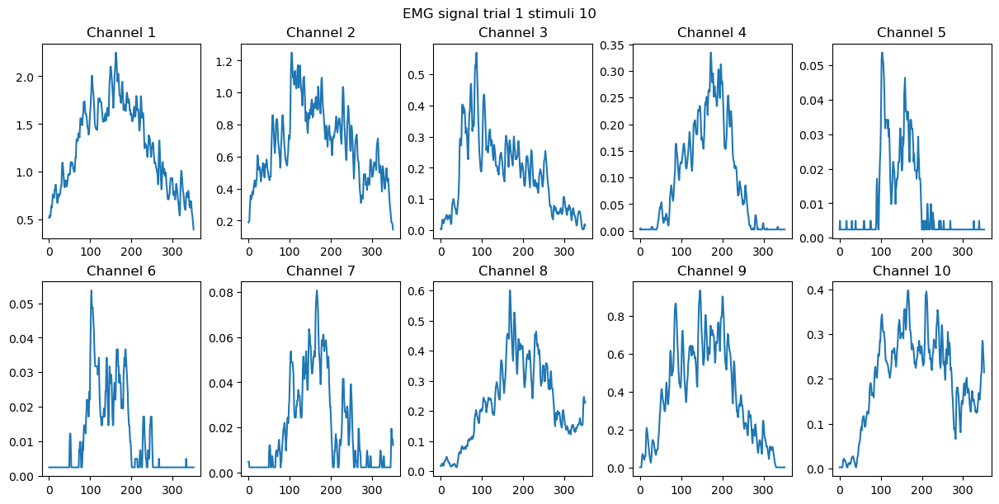

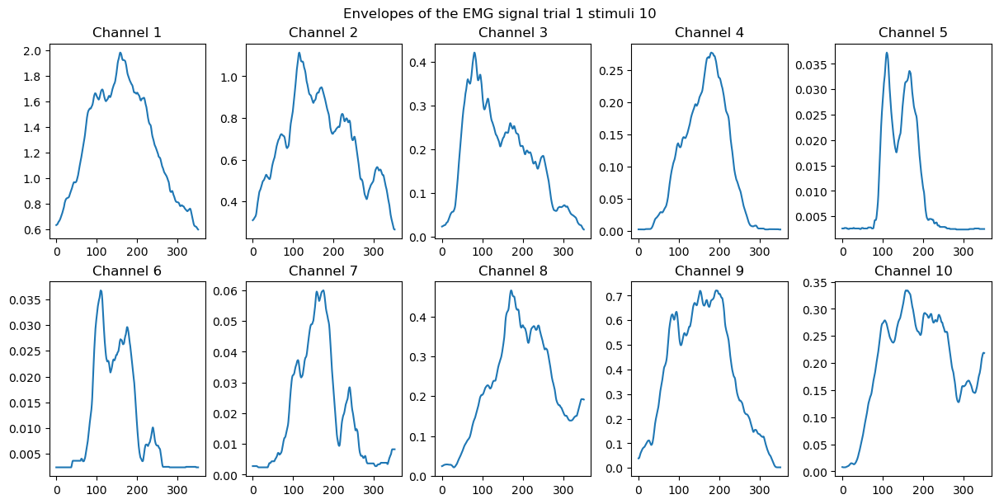

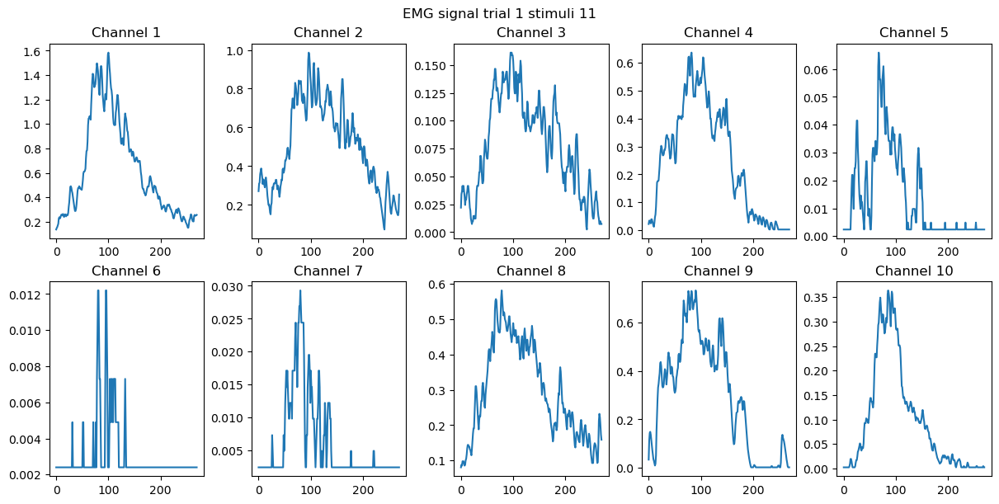

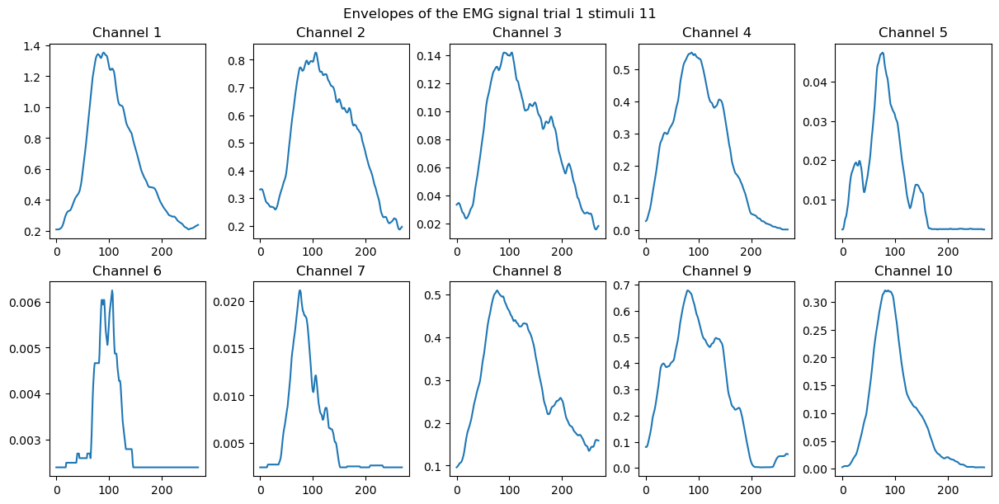

In [276]:
for stimuli in range(n_stimuli) :
# Plot EMG signal
    fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True)
    ax = ax.ravel()
    
    # 10 EMG channels
    number_of_emg_channels = emg.shape[-1]
    
    for channel_idx in range(number_of_emg_channels):
        ax[channel_idx].plot(emg_windows[stimuli][0][:, channel_idx])
        ax[channel_idx].set_title(f"Channel {channel_idx + 1}")
    
    plt.suptitle("EMG signal trial 1 stimuli " +str(stimuli))
    
    # Plot Envelopes of the EMG signal
    fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True)
    ax = ax.ravel()
    
    for channel_idx in range(number_of_emg_channels):
        ax[channel_idx].plot(emg_envelopes[stimuli][0][:, channel_idx])
        ax[channel_idx].set_title(f"Channel {channel_idx + 1}")
    
    plt.suptitle("Envelopes of the EMG signal trial 1 stimuli " + str(stimuli))
    plt.show()

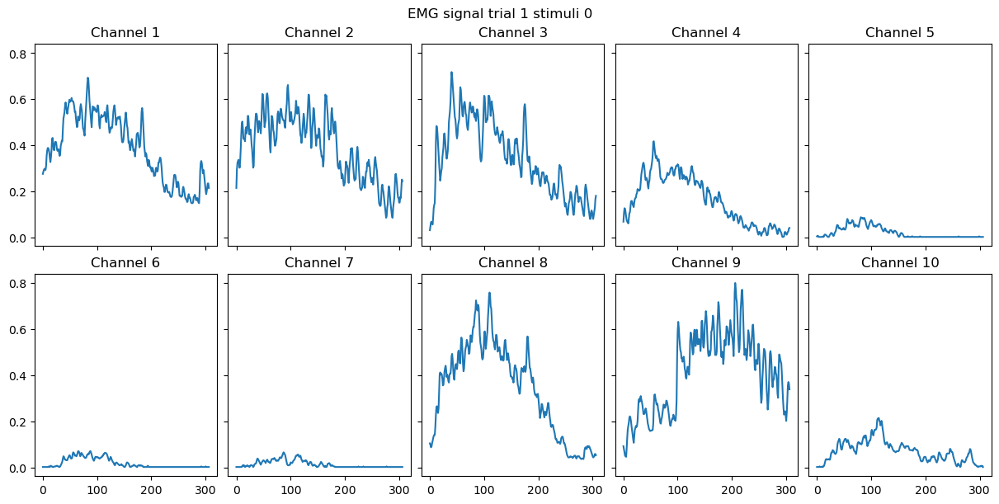

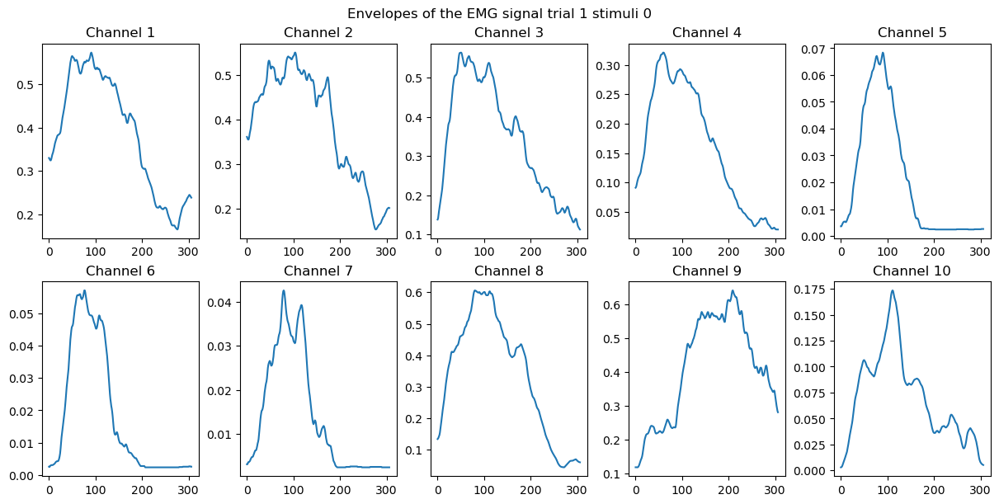

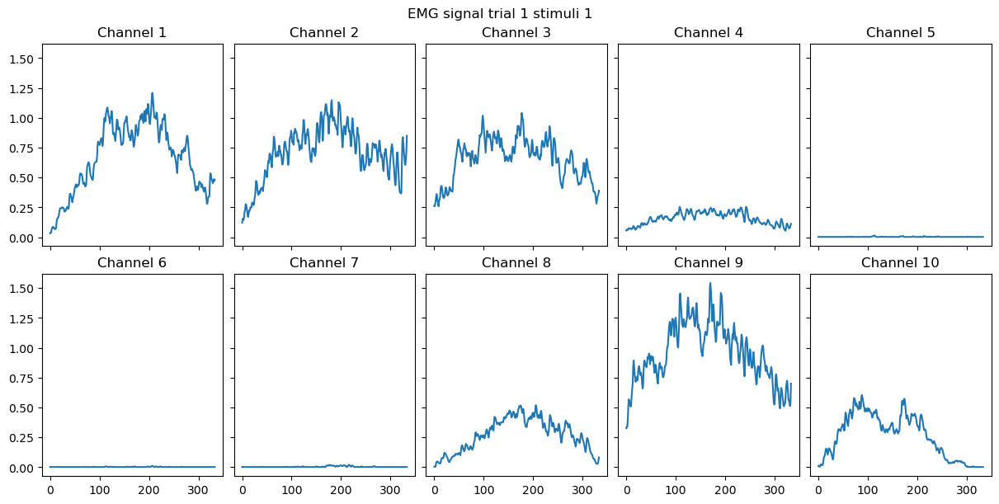

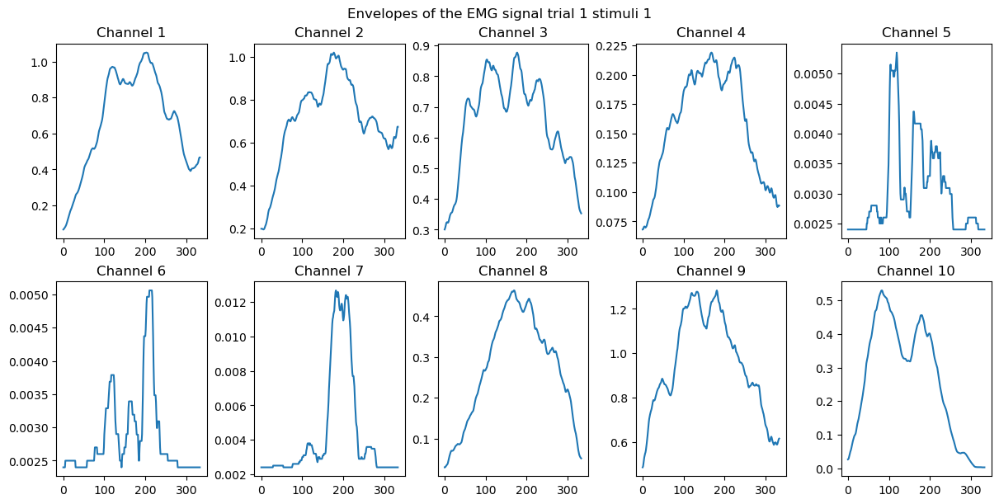

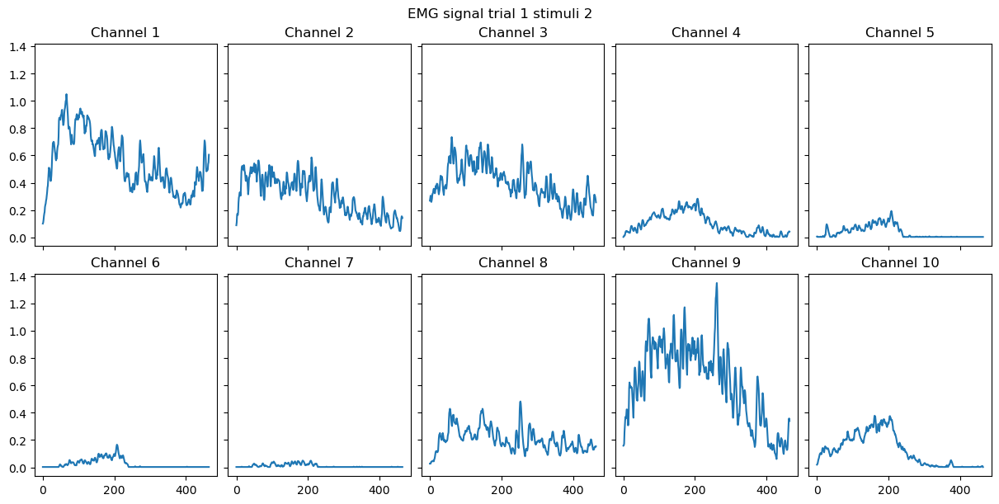

...

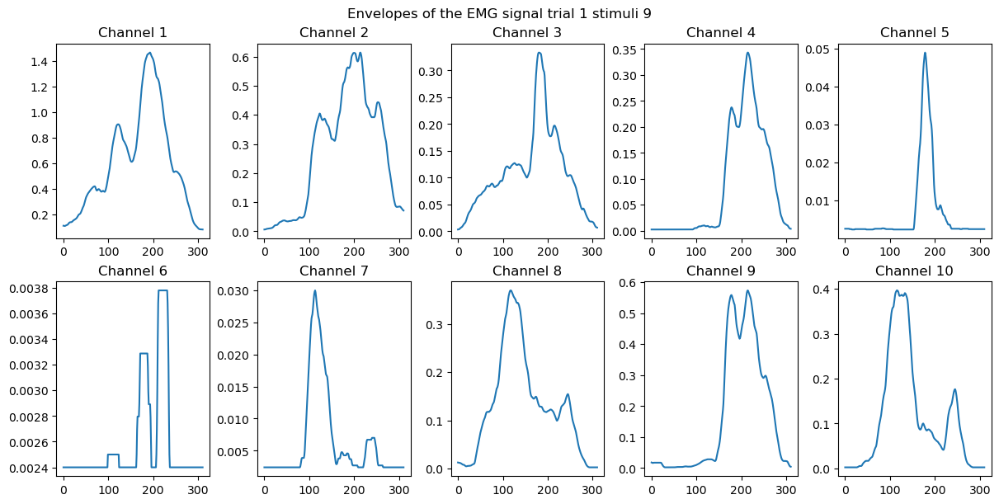

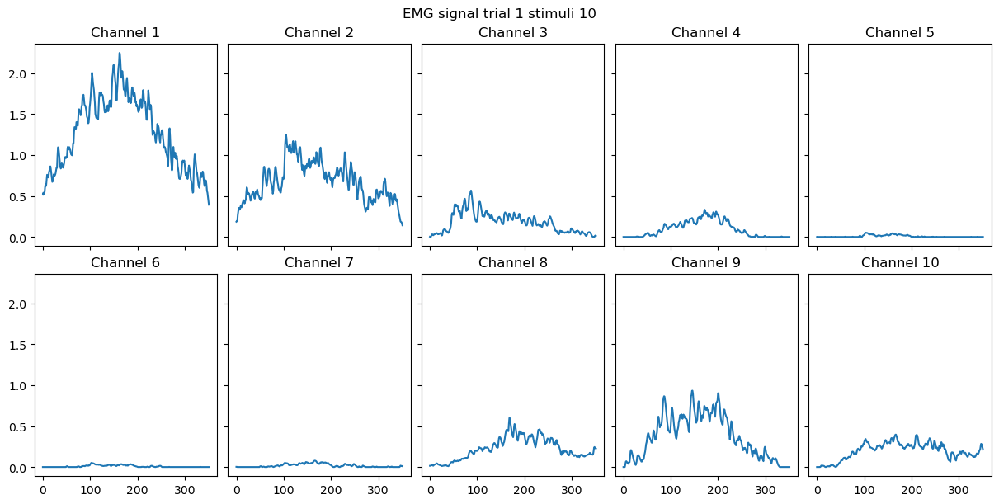

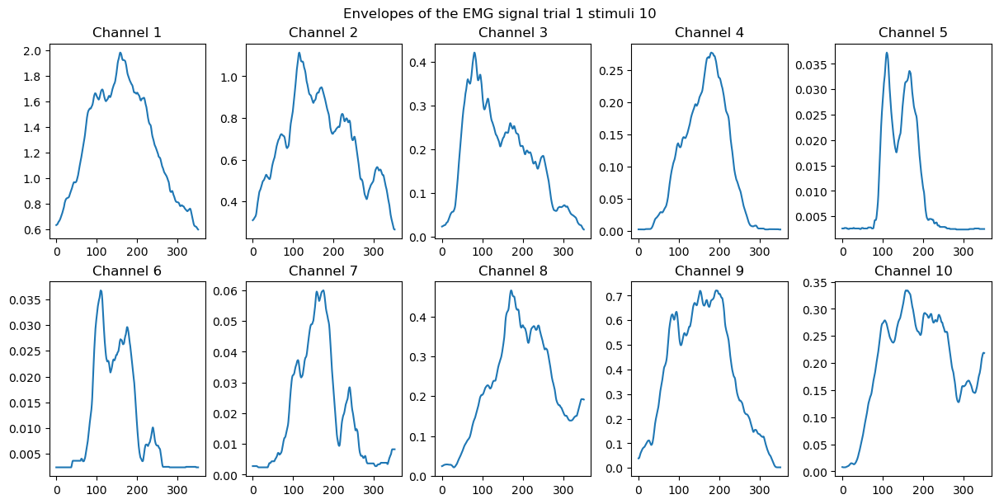

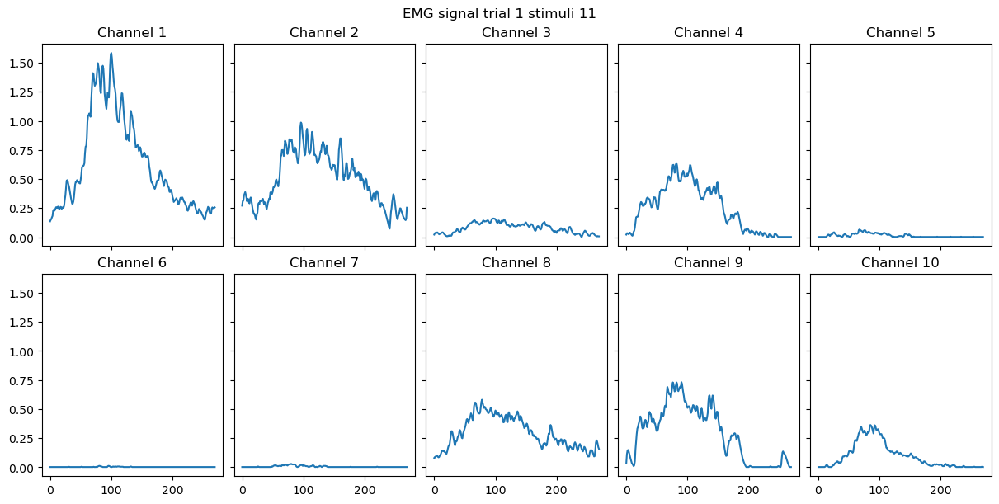

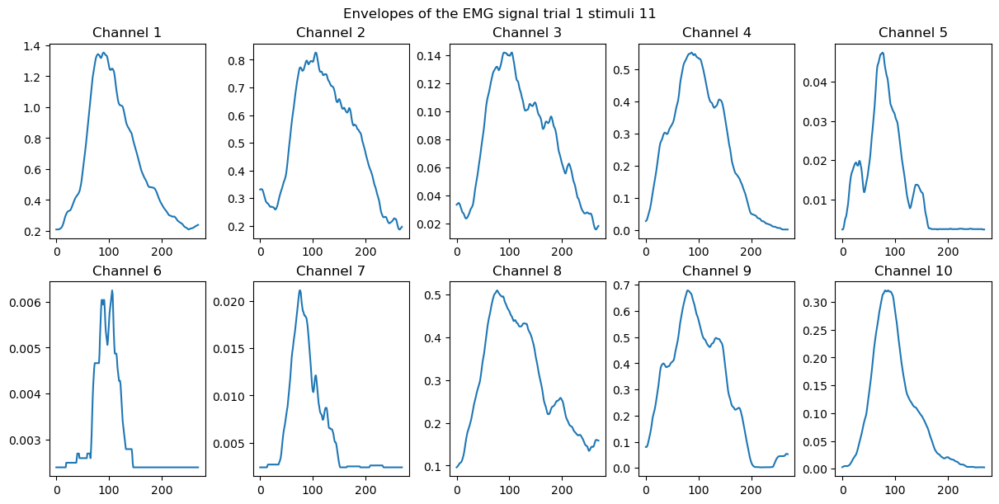

In [277]:
# Now we plot all the channels on the same y-scale

for stimuli in range(n_stimuli) :
# Plot EMG signal
    fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True, sharex=True, sharey=True)
    ax = ax.ravel()
    
    # 10 EMG channels
    number_of_emg_channels = emg.shape[-1]
    
    for channel_idx in range(number_of_emg_channels):
        ax[channel_idx].plot(emg_windows[stimuli][0][:, channel_idx])
        ax[channel_idx].set_title(f"Channel {channel_idx + 1}")
    
    plt.suptitle("EMG signal trial 1 stimuli " +str(stimuli))
    
    # Plot Envelopes of the EMG signal
    fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True)
    ax = ax.ravel()
    
    for channel_idx in range(number_of_emg_channels):
        ax[channel_idx].plot(emg_envelopes[stimuli][0][:, channel_idx])
        ax[channel_idx].set_title(f"Channel {channel_idx + 1}")
    
    plt.suptitle("Envelopes of the EMG signal trial 1 stimuli " + str(stimuli))
    plt.show()

ADD MORE EXPLANATION

We can see that channel 5, 6 and 7 do not catch a lot of signal for some trials. We will look at the distribution of information for each trials

In [278]:
emg_average_activations = np.zeros((n_channels, n_stimuli, n_repetitions))
for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        #mean across time for each channel
        emg_average_activations[:, stimuli_idx, repetition_idx] = np.mean(emg_envelopes[stimuli_idx][repetition_idx], axis=0) 

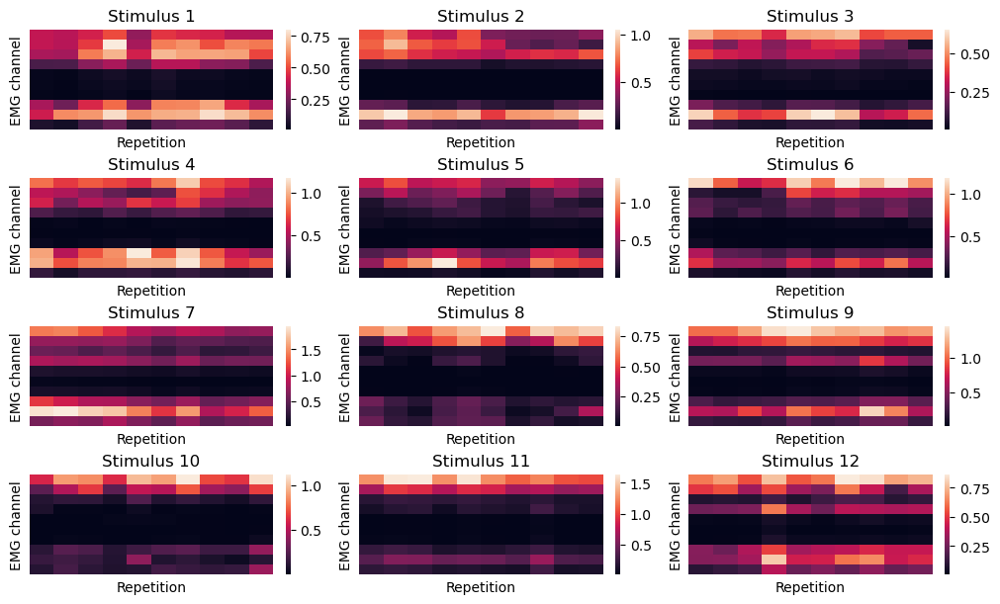

In [279]:
fig, ax = plt.subplots(4, 3, figsize=(10, 6), constrained_layout=True, sharex=True, sharey=True)
ax = ax.ravel()

for stimuli_idx in range(n_stimuli):
    sns.heatmap(np.squeeze(emg_average_activations[:, stimuli_idx, :]), ax=ax[stimuli_idx] ,xticklabels=False, yticklabels=False, cbar = True)
    ax[stimuli_idx].title.set_text("Stimulus " + str(stimuli_idx + 1))
    ax[stimuli_idx].set_xlabel("Repetition")
    ax[stimuli_idx].set_ylabel("EMG channel")

In fact channel 5, 6 and 7 aren't catching a lot of stimulus for most of the trials. We will look at trial with big values in one or more channel. 

#### look for outliers

In [280]:
print(emg_average_activations.shape)

mean_trials = []
max_trials = []
min_trials = []
#for each trials
for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        mean_trials.append(np.mean(emg_average_activations[:, stimuli_idx, repetition_idx]))
        max_trials.append(np.max(emg_average_activations[:, stimuli_idx, repetition_idx]))
        min_trials.append(np.min(emg_average_activations[:, stimuli_idx, repetition_idx]))

print(len(mean_trials))

(10, 12, 10)
120


Text(0.5, 1.0, 'min per trials')

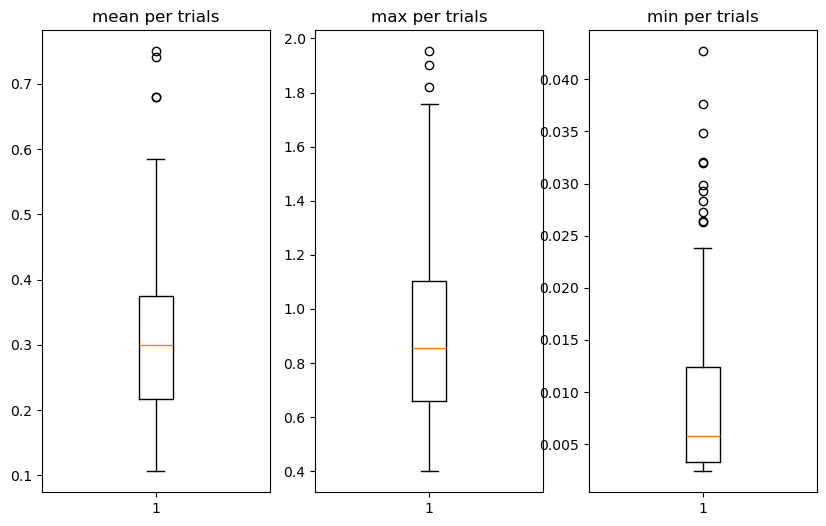

In [281]:
fig, ax = plt.subplots(1, 3, figsize=(10, 6))
ax = ax.ravel()

mean_boxplot = ax[0].boxplot(mean_trials)
ax[0].set_title("mean per trials")

max_boxplot = ax[1].boxplot(max_trials)
ax[1].set_title("max per trials")

min_boxplot = ax[2].boxplot(min_trials)
ax[2].set_title("min per trials")

We will look at trials with extreme value. Below choose 1 list to visualise.

In [282]:
# high mean
high_mean = [i for i, n in enumerate(mean_trials) if n > 0.6]
# low mean
low_mean = [i for i, n in enumerate(mean_trials) if n < 0.2]

# high max
high_max = [i for i, n in enumerate(max_trials) if n > 1.8]
# low max
low_max = [i for i, n in enumerate(max_trials) if n < 0.5]

# high min
high_min = [i for i, n in enumerate(max_trials) if n > 0.025]
# low min
low_min = [i for i, n in enumerate(mean_trials) if n < 0.002]

print("trials with high mean (outlier) are ",high_mean)
#print("trials with low mean are ",low_mean)

print("trials with high max are ",high_max)
#print("trials with low max are ",low_max)

print("trials with high min are ",high_min)
#print("trials with low min are ",low_min)

trials with high mean (outlier) are  [60, 61, 62, 63]
trials with high max are  [60, 61, 62]
trials with high min are  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119]


the minimum is not really a problem, since there is channel that don't catch that much data. Hoewever, some trials have a high value.

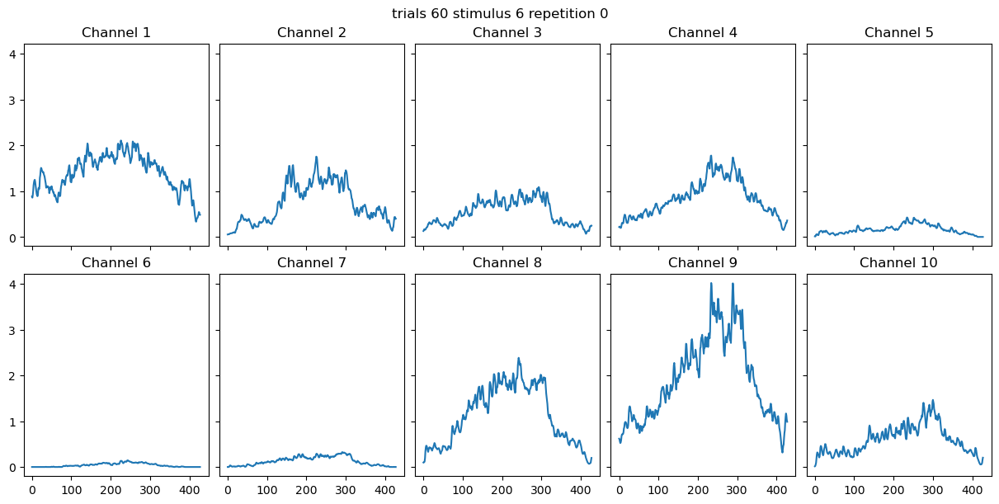

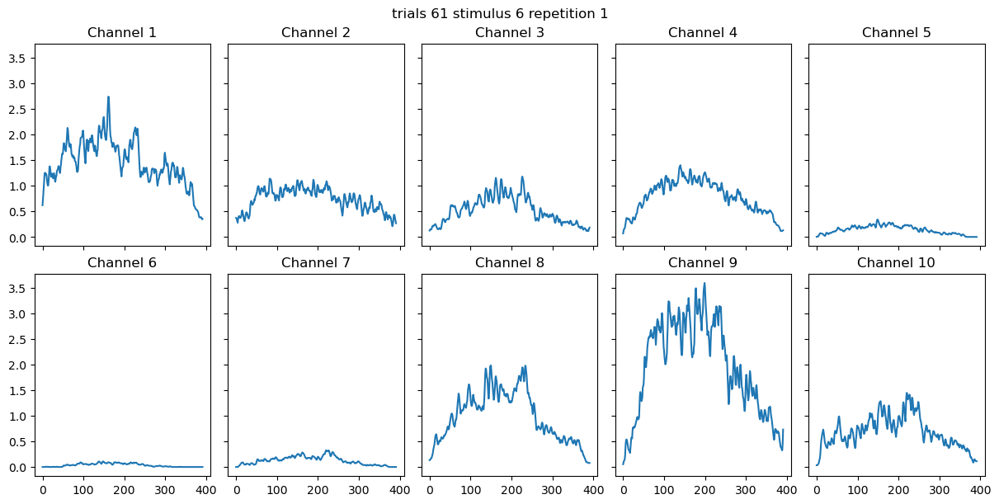

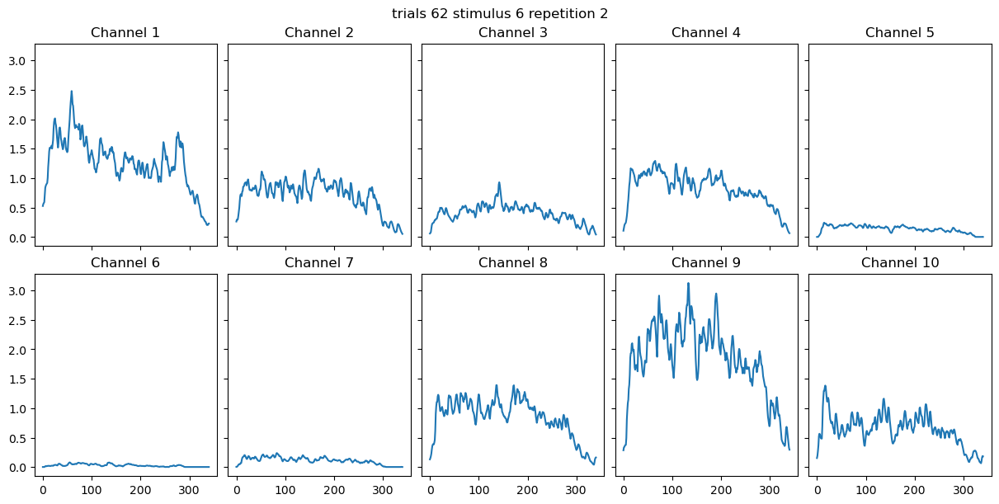

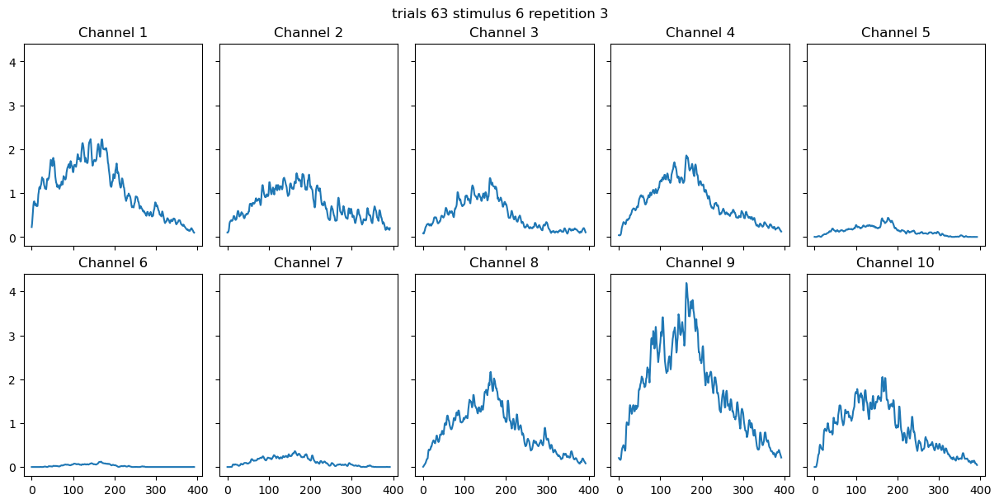

In [283]:
for trials in high_mean :
    stimulus_data = trials//n_repetitions
    repetition_data = trials%n_repetitions
    
# Plot EMG signal
    fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True, sharex=True, sharey=True)
    ax = ax.ravel()
    
    # 10 EMG channels
    number_of_emg_channels = emg.shape[-1]
    
    for channel_idx in range(number_of_emg_channels):
        ax[channel_idx].plot(emg_windows[stimulus_data][repetition_data][:, channel_idx])
        ax[channel_idx].set_title(f"Channel {channel_idx + 1}")
    
    plt.suptitle("trials {} stimulus {} repetition {}".format(trials,stimulus_data,repetition_data))

We see a big artifact for the channel 9 in all the trials.

#### Preprocessing (but bad)

In [284]:
#1st order Butterworth low-pass filter with 1Hz cutoff frequency
fs = 2000
cutoff_frequency = 1
sos = butter(N=4, Wn=cutoff_frequency, fs=fs, btype="lowpass", output="sos") 
emg_filtered = sosfiltfilt(sos, emg.T).T 

Text(0.5, 1.0, 'Power Spectral Density plot in Log scale')

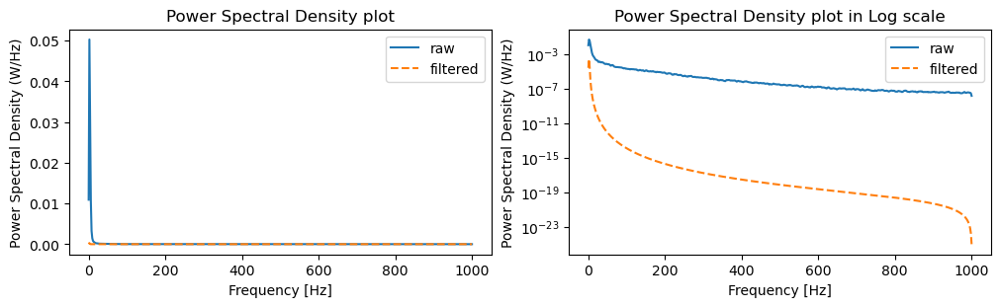

In [285]:
#check how power density changed after filtering 
#Use Welch's method for power spectral density estimation, it reduces the variance of the estimate.
freqs_pre, Pxx_pre = welch(emg[:, 0], fs=fs, nperseg=1064)
freqs_post, Pxx_post = welch(emg_filtered[:, 0],fs = fs,  nperseg=1064)

fig, ax = plt.subplots(1, 2, constrained_layout=True, figsize=(10, 3))
ax[0].plot(freqs_pre, Pxx_pre, label="raw")
ax[0].plot(freqs_post, Pxx_post, linestyle="--", label="filtered")
ax[0].legend()
ax[0].set_xlabel("Frequency [Hz]")
ax[0].set_ylabel("Power Spectral Density (W/Hz)")
ax[0].set_title("Power Spectral Density plot")

ax[1].semilogy(freqs_pre, Pxx_pre, label="raw")
ax[1].semilogy(freqs_post, Pxx_post, linestyle="--", label="filtered")
ax[1].legend()
ax[1].set_xlabel("Frequency [Hz]")
ax[1].set_ylabel("Power Spectral Density (W/Hz)")
ax[1].set_title("Power Spectral Density plot in Log scale")

Text(0.5, 0.98, 'Rectified EMG signal')

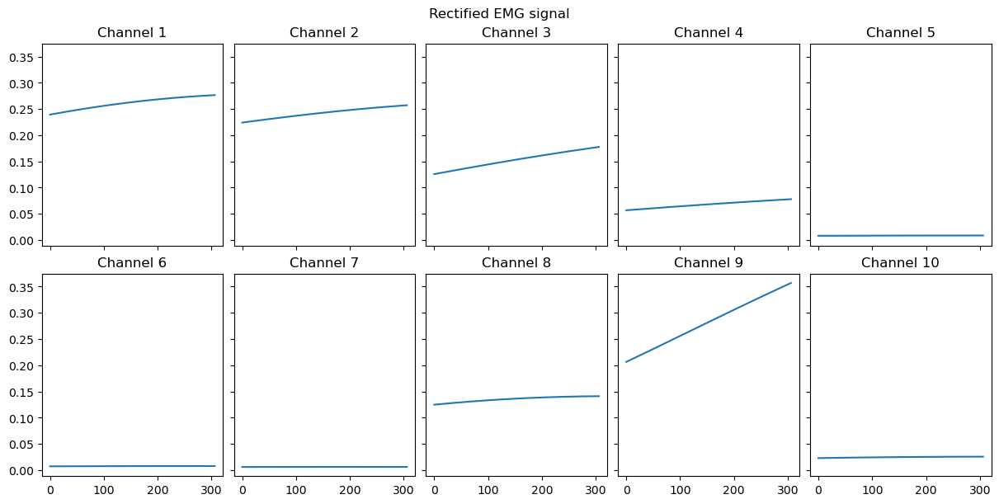

In [286]:
emg_windows_filtered = [[None for repetition_idx in range(n_repetitions)] for stimuli_idx in range(n_stimuli)]
for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        idx = np.logical_and(stimulus == stimuli_idx + 1, repetition == repetition_idx + 1).flatten()
        emg_windows_filtered[stimuli_idx][repetition_idx] = emg_filtered[idx, :]
        
# Now we plot all the channels on the same y-scale
fig, ax = plt.subplots(2, 5, figsize=(12, 6), constrained_layout=True, sharex=True, sharey=True)
ax = ax.ravel()

number_of_emg_channels = emg.shape[-1]
# plot Rectified EMG signal
for channel_idx in range(number_of_emg_channels): 
    ax[channel_idx].plot(emg_windows_filtered[0][0][:, channel_idx])
    ax[channel_idx].set_title(f"Channel {channel_idx+1}")
plt.suptitle("Rectified EMG signal")

In [287]:
def build_dataset(emg, stimulus, repetition):
    print(f"dataset shape before splitting: {emg.shape}")
    # Calculate the number of unique stimuli and repetitions, subtracting 1 to exclude the resting condition
    n_stimuli = np.unique(stimulus).size - 1
    print(f"number of stimuli: {n_stimuli}")
    n_repetitions = np.unique(repetition).size - 1
    print(f"number of rep: {n_repetitions}")
    # Total number of samples is the product of stimuli and repetitions
    n_samples = n_stimuli * n_repetitions
    print(f"number of sample: {n_samples}")
    # Number of channels in the EMG data
    n_channels = emg.shape[1]
    
    # Initialize the dataset and labels arrays with zeros
    dataset = []
    labels = np.zeros(n_samples)
    current_sample_index = 0
    
    # Loop over each stimulus and repetition to extract features
    for i in range(n_stimuli):
        for j in range(n_repetitions):
            # Assign the label for the current sample
            labels[current_sample_index] = i + 1
            # Calculate the current sample index based on stimulus and repetition
            current_sample_index = i * n_repetitions + j
            # Select the time steps corresponding to the current stimulus and repetition
            selected_tsteps = np.logical_and(stimulus == i + 1, repetition == j + 1).squeeze()
            #print(f"size of sample {current_sample_index +1} : {sum(selected_tsteps)}")
            dataset.append(emg[selected_tsteps, :])
            # Move to the next sample
            current_sample_index += 1
            
    # Return the constructed dataset and corresponding labels
    return dataset, labels

### 2 Split the data into train/test/validation sets

#### reformat the data

We will reformat the data into trials before splitting.
For now, emg_windows have the format stimulus * repetition * trials (with different format for each trials).
For simplicity, we will reformat to trials and assign labels.

In [288]:
print("recall, number of trials".format(n_stimuli*n_repetitions))

#current format
print(len(emg_windows))
print(len(emg_windows[0]))
print(emg_windows[0][0].shape)

# Flatten using Nested Loops
dataset = []
label = np.zeros(n_stimuli*n_repetitions)

for stimuli_idx in range(n_stimuli):
    for repetition_idx in range(n_repetitions):
        dataset.append(emg_windows[stimuli_idx][repetition_idx])
        label[stimuli_idx*n_repetitions + repetition_idx] = stimuli_idx +1 
        
print(f"dataset size: {len(dataset)}")
print(f"trial 1 dimension (example): {dataset[0].shape}")
print(f"trial 2 dimension (example): {dataset[1].shape}")
print(f"labels dimension: {labels.shape}")

recall, number of trials
12
10
(307, 10)
dataset size: 120
trial 1 dimension (example): (307, 10)
trial 2 dimension (example): (390, 10)
labels dimension: (120,)


#### Splitting the data
split into train, validation, test 

In [289]:
# Split the dataset into training and testing sets
train_ratio = 0.75
validation_ratio = 0.10
test_ratio = 0.15

# Here, 75% of the data is reserved for training
data_train, data_test, y_train, y_test = train_test_split(dataset, labels, test_size=1 - train_ratio)

# Here, 15% of the data is reserved for testing, 10 for validation
data_val, data_test, y_val, y_test = train_test_split(data_test, y_test, test_size=test_ratio/(test_ratio + validation_ratio))

print(f"train size: {len(data_train)}")
print(f"trial train 1 dimension (example): {data_train[0].shape}")
print(f"validation size: {len(data_val)}")
print(f"trial validation 1 dimension (example): {data_val[0].shape}")
print(f"train size: {len(data_test)}")
print(f"trial test 1 dimension (example): {data_test[0].shape}")

train size: 90
trial train 1 dimension (example): (317, 10)
validation size: 12
trial validation 1 dimension (example): (463, 10)
train size: 18
trial test 1 dimension (example): (334, 10)


### 3 Extract features and explore them

#### Create the features

In [290]:
# Mean absolute value (MAV)
mav = lambda x: np.mean(np.abs(x), axis=0)

# Standard Deviation (STD)
std = lambda x: np.std(x, axis=0)

# Maximum absolute Value (MaxAV)
maxav = lambda x: np.max(np.abs(x), axis=0)

# Root mean square (RMS)
rms = lambda x: np.sqrt(np.mean(x**2, axis=0))

# Waveform length (WL)
wl = lambda x: np.sum(np.abs(np.diff(x, axis=0)), axis=0)

# Slope sign changes (SSC)
ssc = lambda x: np.sum(
    ((x[1:-1] - x[:-2]) * (x[2:] - x[1:-1])) < 0,
    axis=0
)

#### extract the features

In [291]:
def extract_features(emg_dataset, features):

    n_samples = len(emg_dataset)
    #print("sample size", n_samples)
    n_channels = emg_dataset[0].shape[1]
    # Calculate the total number of features by summing the number of channels for each feature
    n_features = sum(n_channels for feature in features)
    #print("number of features",n_features)
    # Initialize the dataset and labels arrays with zeros
    dataset = np.zeros((n_samples, n_features))

    for i in range(len(emg_dataset)) :
        current_feature_index = 0
        # Loop over each feature function provided
        for feature in features:
            # Determine the indices in the dataset where the current feature will be stored
            selected_features = np.arange(current_feature_index, current_feature_index + n_channels)
            # Apply the feature function to the selected EMG data and store the result
            dataset[i, selected_features] = feature(emg_dataset[i])
            # Update the feature index for the next feature
            current_feature_index += n_channels

    # Return the constructed dataset and corresponding labels
    return dataset

X_train = extract_features(data_train, features=[mav, std, maxav, rms, wl, ssc])
X_val = extract_features(data_val, features=[mav, std, maxav, rms, wl, ssc])
X_test = extract_features(data_test, features=[mav, std, maxav, rms, wl, ssc])

print("train,val and test dataset dimention {} {} {}".format(X_train.shape,X_val.shape,X_test.shape))

train,val and test dataset dimention (90, 60) (12, 60) (18, 60)


#### exploration (using training data)

In [292]:
features=["mav", "std", "maxav", "rms", "wl", "ssc"]
nb_features = len(features)
col = [f"channel {i}" for i in range(1, n_channels+1)]

DataMean = pd.DataFrame(X_train.mean(axis = 0).reshape(nb_features,n_channels),columns=col, index=features)
DataMean

,channel 1,channel 2,channel 3,channel 4,channel 5,channel 6,channel 7,channel 8,channel 9,channel 10
mav,0.779838,0.501066,0.285047,0.251495,0.034261,0.011823,0.024858,0.376753,0.670430,0.193255
std,0.332090,0.200250,0.132236,0.163090,0.031841,0.012963,0.024141,0.227715,0.353401,0.137355
maxav,1.494166,0.997852,0.606913,0.630022,0.132547,0.058784,0.098850,0.894943,1.480437,0.539087
rms,0.851122,0.544404,0.317294,0.302707,0.047384,0.017780,0.034912,0.442635,0.765165,0.239379
wl,10.997637,11.161477,5.999250,4.535503,1.098662,0.406648,0.804471,6.240934,13.711891,4.142030
ssc,94.477778,96.011111,80.511111,65.900000,38.644444,17.866667,30.444444,75.922222,84.822222,63.522222


Text(0.5, 0.98, 'Mean on each chanel')

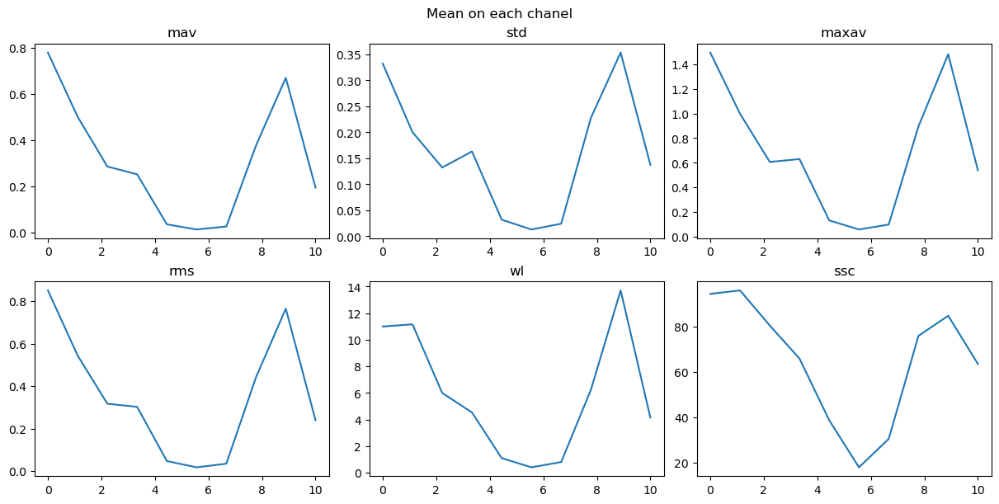

In [293]:
fig, ax = plt.subplots(2, 3, figsize=(12, 6), constrained_layout=True)
ax = ax.ravel()

# plot Rectified EMG signal
for feature in range(nb_features): 
    ax[feature].plot(np.linspace(0,n_channels,n_channels),DataMean.iloc[feature])
    ax[feature].set_title(features[feature])
plt.suptitle("Mean on each chanel")

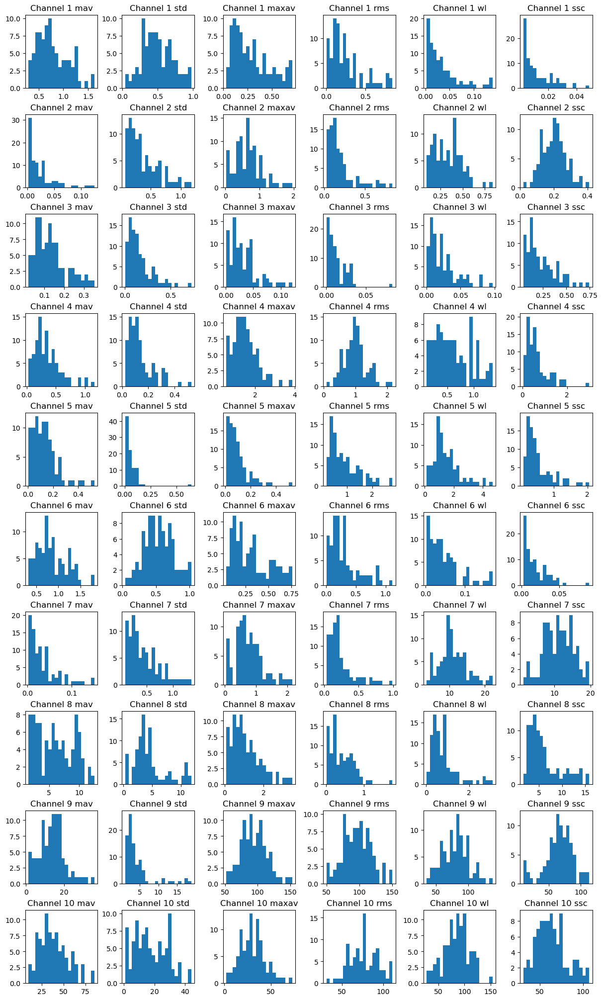

In [301]:
fig, ax = plt.subplots(n_channels, nb_features, figsize=(12, 20), constrained_layout=True)
ax = ax.ravel()

i = 0
for channel in range(n_channels):
    for feature in range(nb_features) :
        ax[i].hist(X_train[:,channel*nb_features+feature],bins=20)
        ax[i].set_title("Channel " + str(channel +1) + " " + features[feature])
        i += 1

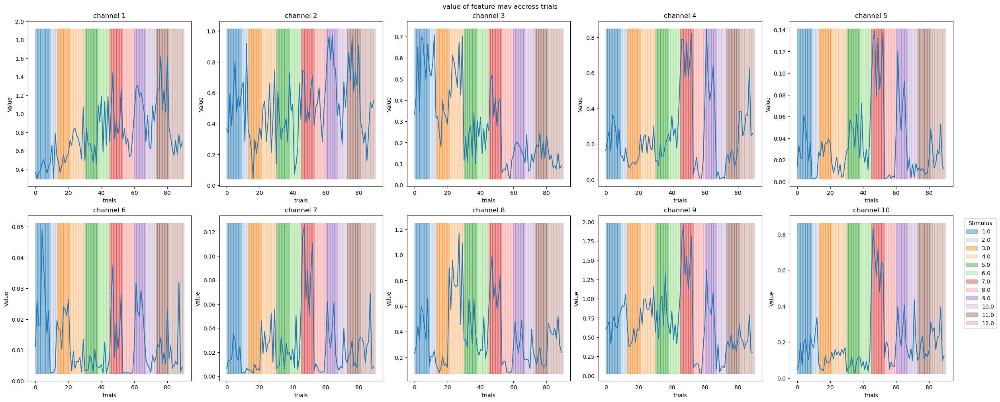

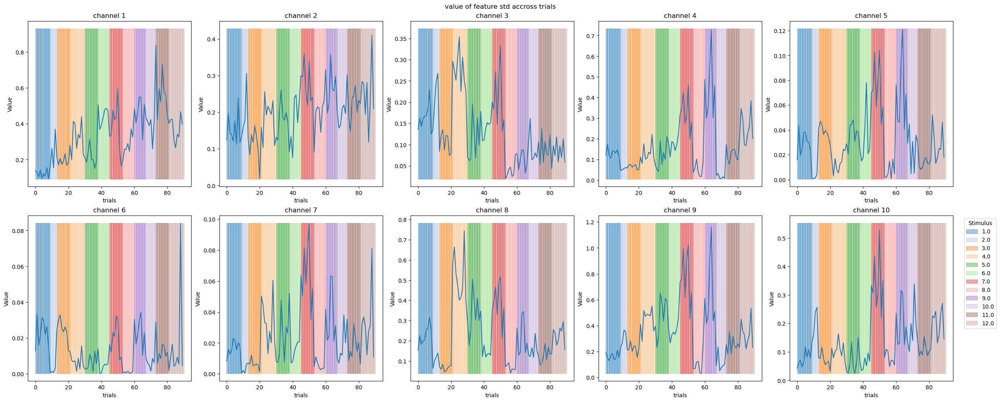

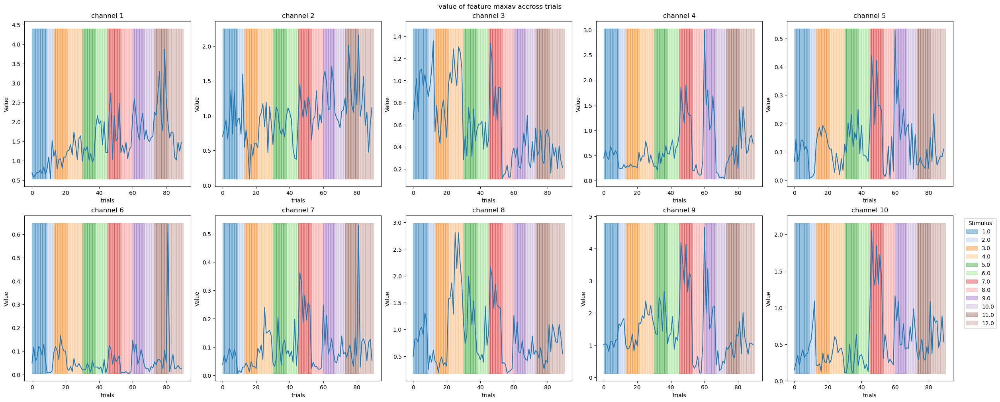

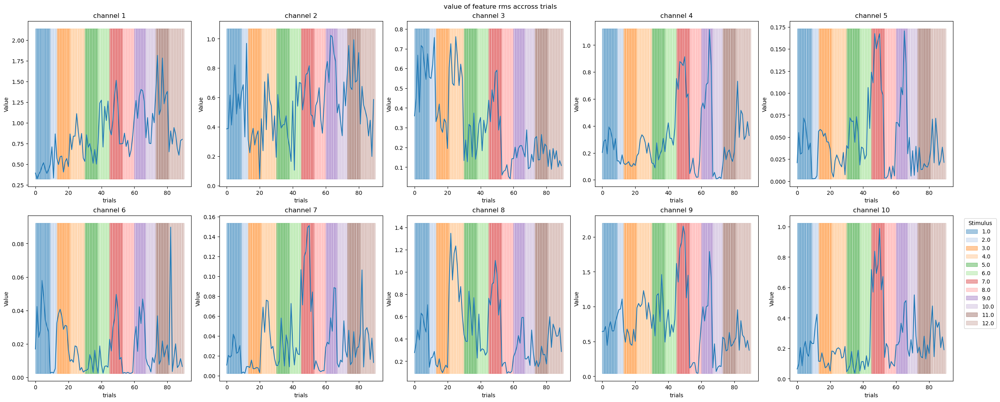

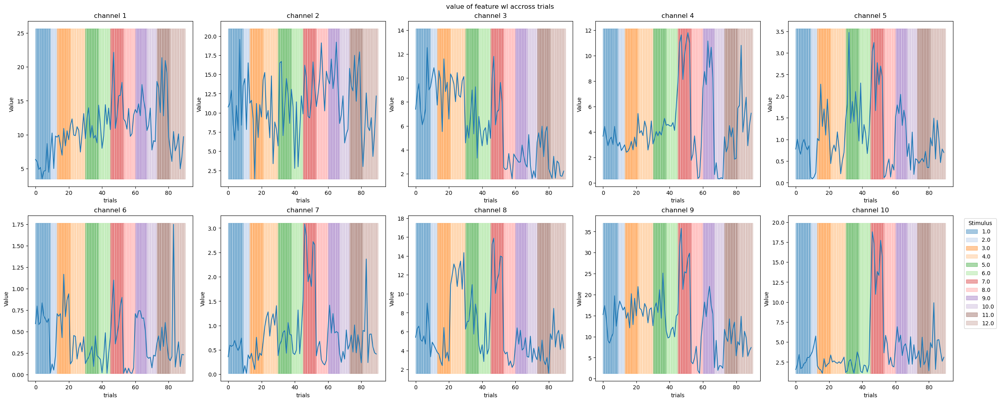

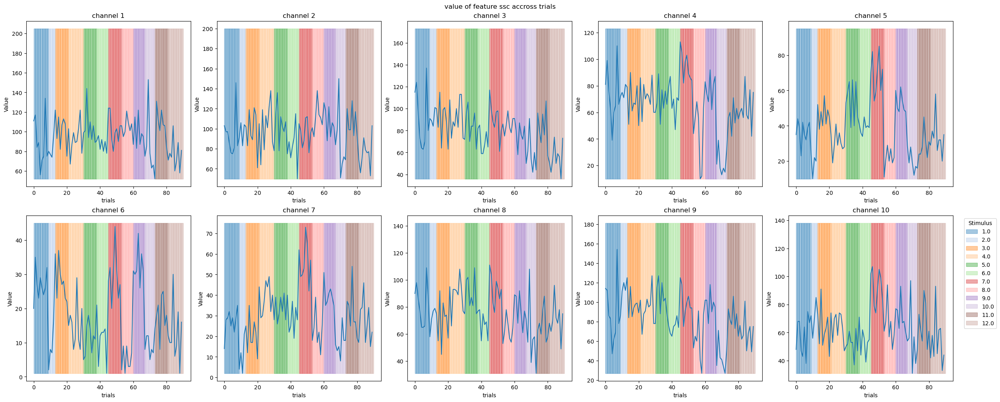

In [308]:
def plot_data(dataset,labels,sort = True):
    colors = sns.color_palette("tab20", n_colors=12) 
        
    for feature_nb,feature in enumerate(features) : 
        fig, ax = plt.subplots(2, 5, figsize=(25, 10), constrained_layout=True)
        ax = ax.ravel()

        if sort :
            sorted_indices = np.argsort(labels)
            labels = labels[sorted_indices]
            dataset = dataset[sorted_indices]
            
        for channel in range(n_channels):
            # Draw stimulus
            dataplot = dataset[:,channel+(feature_nb*n_channels)]
            for i, label in enumerate(labels):
                rect = Rectangle((i, min(dataplot)), 1, max(dataplot), color=colors[int(label - 1)], alpha=0.4)  # Background rectangle
                ax[channel].add_patch(rect)
            #add feature
            ax[channel].plot(dataplot)
            ax[channel].set_xlabel("trials")
            ax[channel].set_ylabel("Value")
            ax[channel].set_title("channel {}".format(channel+1))
        
        handles = [Rectangle((0, 0), 1, 1, color=colors[i], alpha=0.4) for i in range(12)]  # Create legend patches
        plt.legend(handles, np.linspace(1,n_stimuli,n_stimuli), title="Stimulus", bbox_to_anchor=(1.05, 1), loc='upper left')
        
        plt.suptitle("value of feature {} accross trials".format(feature))
        plt.show()

plot_data(X_train,y_train)  
#plot_data(X_test,y_test)  
#plot_data(X_val,y_val)  

### 4 Classification using Random Forest

In [251]:
# Normalizing the data with a mean of 0 and a standard deviation of 1
scaler = StandardScaler()
X_train_z = scaler.fit_transform(X_train)  
X_test_z = scaler.transform(X_test)   

print("Train shape {}".format(X_train_z.shape))
print("Test shape {}".format(X_test_z.shape))

Train shape (90, 60)
Test shape (18, 60)


#### Hyperparameters optimization : method 1

In [47]:
# Define the parameter grid for RandomizedSearchCV
param_dist = {
    'n_estimators': [50, 100, 200, 300, 400],  # Number of trees
    'max_depth': [None, 10, 20, 30, 40],       # Maximum depth of each tree
    'min_samples_split': [2, 5, 10],           # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],             # Minimum number of samples required to be at a leaf node
    'max_features': ['sqrt', 'log2', None],    # Number of features to consider for the best split
    'bootstrap': [True, False]                 # Whether bootstrap samples are used when building trees
}

# Initialize the Random Forest Classifier
rf = RandomForestClassifier(random_state=42)

# Perform RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=50,  # Number of parameter settings sampled
    scoring='accuracy',
    cv=5,       # 5-fold cross-validation
    random_state=42,
    verbose=2,
    n_jobs=-1   # Use all available cores
)

# Fit the model to the training data
random_search.fit(X_train_z, y_train)

# Get the best parameters and best model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

print("Best Parameters:", best_params)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END bootstrap=True, max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END bootstrap=True, max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=True, max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END bootstrap=True, max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END bootstrap=True, max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.2s
[CV] END bootstrap=True, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total

In [54]:
y_pred1 = best_model.predict(X_test_z)
print("Predicted actions:", y_pred1)

Predicted actions: [ 6.  4.  9. 11.  1.  9.  9.  3.  6.  7.  7.  4. 10. 11.  8.  5. 10.  2.
 10.  3. 11.  2.  9.  1. 11.  9.  1. 10. 12.  7.  1.  2.  5.  5. 12. 12.]


#### Hyperparameters optimization : method 2

In [55]:
param_grid = {
    "n_estimators": [10,50,100,500], #range(10, 100, 10),
    "bootstrap": [True, False],
    "criterion": ['gini', 'absolute_error', 'poisson', "log_loss"],
    "max_features" : ["sqrt", "log2", 1, 5, 10, None], 
    "max_depth": [None, 10, 20, 30, 40],
    "max_leaf_nodes": range(3,15,5),
}

grid = GridSearchCV(RandomForestClassifier(), param_grid)
grid.fit(X_train_z,y_train)

print(f"Best estimator: {grid.best_estimator_}")
print(f"Best hyperparameters: {grid.best_params_}")

KeyboardInterrupt: 

### 5 Evaluate the performance

In [256]:
def evaluation(y_pred,y,name = "") :
    
    #Calculate accuracy
    accuracy = accuracy_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    print(f"Accuracy score : {accuracy}")
    print(f"F1 Score: {f1}")

    #Create a confusion matrix
    confmat = confusion_matrix(y, y_pred, normalize="true")
    mask = confmat == 0
    fig, ax = plt.subplots(figsize=(8, 6))
    sns.heatmap(confmat, annot=np.where(mask, "0", confmat.round(2)), fmt="", cmap="Blues", cbar=True, ax=ax)
    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")
    plt.title("Confusion Matrix")
    plt.show()

#### Method 1

In [254]:
evaluation(y_test, y_pred1)

NameError: name 'y_pred1' is not defined

### 6 Features selection / Dimension reduction

#### Method 1 : Mutual information for feature selection

In [255]:
# Step 1: Calculate mutual information
mutual_info = mutual_info_classif(X_train_z, y_train)
print(f"Estimated mutual information between each feature and the target:\n {mutual_info}\n")

# Step 2: Select top 'k' features based on mutual information scores
k = 10  # number of top features to select
k_best = SelectKBest(score_func=mutual_info_classif, k=k)
k_best.fit(X_train_z, y_train)

# Step 3: Transform datasets to include only the selected features
X_train_best = k_best.transform(X_train_z)
X_test_best = k_best.transform(X_test_z)

# Step 4: Train a Random Forest Classifier using the reduced feature set
# Fit the model to the training data
random_search.fit(X_train_best, y_train)
best_model = random_search.best_estimator_

# Step 5: Evaluate the model
y_pred = best_model.predict(X_test_best)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy score of the Random Forest model with top {k} features: {accuracy}")

# Step 6: Create a confusion matrix for performance visualization
confmat = confusion_matrix(y_test, y_pred, normalize="true")
# Create a mask to hide zero values
mask = confmat == 0

# Plot the confusion matrix with dynamic annotation
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(confmat, annot=np.where(mask, "0", confmat.round(2)), fmt="", cmap="Blues", cbar=True, ax=ax)
ax.set_ylabel("True label")
ax.set_xlabel("Predicted label")
plt.title("Confusion Matrix for Random Forest with Selected Features")
plt.show()

Estimated mutual information between each feature and the target:
 [0.68833204 0.33182939 0.96671516 0.89527459 0.88351289 0.59169366
 0.69246586 0.64187333 0.88065638 0.58659769 0.76990014 0.34901795
 0.75607852 0.90993185 0.71142937 0.67126679 0.6376311  0.64757489
 0.81951954 0.51888996 0.78807553 0.37636026 0.75076715 0.92736203
 0.62793177 0.63263118 0.58997498 0.6534619  0.64774405 0.59012097
 0.78072522 0.3389448  0.88757615 0.90519519 0.82400947 0.6749694
 0.70465909 0.70144196 0.83405591 0.58105152 0.47097319 0.20192142
 0.90705796 0.95471834 0.96512987 0.72006694 0.55511281 0.59927013
 0.75822463 0.58762555 0.12877703 0.05577611 0.20818193 0.39185621
 0.76681796 0.46588957 0.42768581 0.27120266 0.4277569  0.28749895]



NameError: name 'random_search' is not defined

In [57]:
print("Predicted actions:", y_pred)

Predicted actions: [ 6.  4. 12.  6.  1. 12.  5.  3.  6.  7.  7.  4. 10. 11. 11.  6. 11.  2.
 10. 11. 11.  2.  9.  1. 12.  9.  1. 10. 12.  7.  1.  2.  5.  5. 12.  6.]


#### Method 2 : PCA for dimension reduction

Shape after PCA - Training: (84, 17), Testing: (36, 17)
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END bootstrap=True, max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END bootstrap=True, max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END bootstrap=True, max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END bootstrap=True, max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END bootstrap=True, max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   0.1s
[CV] END bootstrap=False, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END bootstrap=False, max_depth=20, max_features=None, min_sa

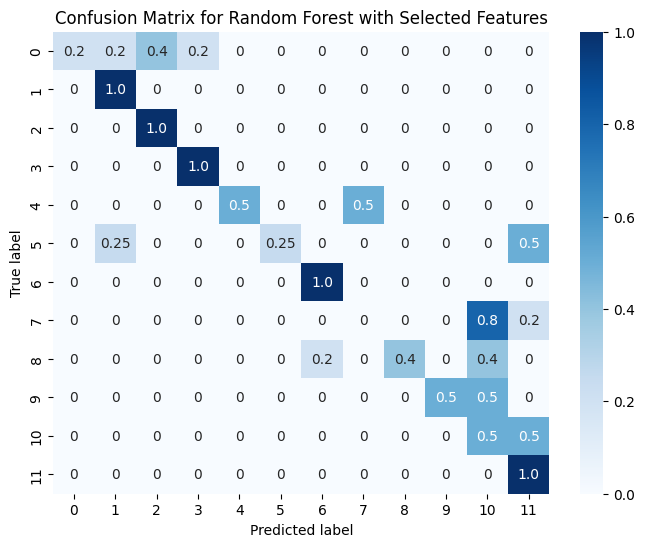

In [58]:
pca = PCA(n_components=0.95)  # Retain 95% of the variance
X_train_pca = pca.fit_transform(X_train_z)
X_test_pca = pca.transform(X_test_z)

print(f"Shape after PCA - Training: {X_train_pca.shape}, Testing: {X_test_pca.shape}")

#Train a Random Forest model on the PCA-transformed data
random_search.fit(X_train_pca, y_train)
best_model = random_search.best_estimator_

y_pred = best_model.predict(X_test_pca)

#Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy score of the Random Forest model with PCA features: {accuracy}")

#Create a confusion matrix
confmat = confusion_matrix(y_test, y_pred, normalize="true")
mask = confmat == 0
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(confmat, annot=np.where(mask, "0", confmat.round(2)), fmt="", cmap="Blues", cbar=True, ax=ax)
ax.set_ylabel("True label")
ax.set_xlabel("Predicted label")
plt.title("Confusion Matrix for Random Forest with Selected Features")
plt.show()

In [ ]:
print("Predicted actions:", y_pred)

#### Method 3 : Recursive Feature Elimination with Cross-Validation (RFECV)

Accuracy score of the Random Forest model with PCA features: 0.75


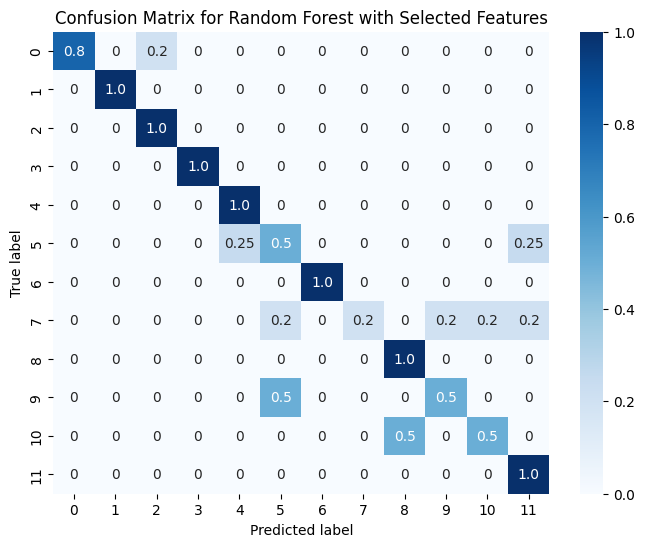

In [60]:
rfecv_model = RFECV(estimator=RandomForestClassifier(random_state=42),
                    step=1,
                    cv=5,
                    scoring='accuracy')
rfecv_model.fit(X_train_z, y_train)

# Transform the train and test sets using selected features
X_train_rfecv = rfecv_model.transform(X_train_z)
X_test_rfecv = rfecv_model.transform(X_test_z)

# Train a RandomForestClassifier on RFECV-selected features
rfecv_final_model = RandomForestClassifier(random_state=42)
rfecv_final_model.fit(X_train_rfecv, y_train)

y_pred = rfecv_final_model.predict(X_test_rfecv)

#Calculate accuracy
rfecv_accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy score of the Random Forest model with PCA features: {rfecv_accuracy}")

#Create a confusion matrix
confmat = confusion_matrix(y_test, y_pred, normalize="true")
mask = confmat == 0
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(confmat, annot=np.where(mask, "0", confmat.round(2)), fmt="", cmap="Blues", cbar=True, ax=ax)
ax.set_ylabel("True label")
ax.set_xlabel("Predicted label")
plt.title("Confusion Matrix for Random Forest with Selected Features")
plt.show()